# Check Preprocessed Spatial Data — X_niche Visualization

Visualizing niche composition matrices (`X_niche_0` through `X_niche_4`)
computed at radii [0.027, 0.054, 0.081, 0.108, 0.135] mm for CosMx human liver.

In [2]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import Normalize
from matplotlib import cm
import warnings
warnings.filterwarnings('ignore')

sc.settings.verbosity = 0
%matplotlib inline

In [3]:
# Load the preprocessed data
DATA_PATH = "/mnt/172/wh/25-12/spatial/preprocessed/nanostring_cosmx_human_liver_normal.h5ad"
adata = sc.read_h5ad(DATA_PATH)
adata

AnnData object with n_obs × n_vars = 332877 × 952
    obs: 'RNA_pca_cluster_default', 'RNA_pca_cluster_default.1', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nCount_negprobes', 'nFeature_negprobes', 'nCount_falsecode', 'nFeature_falsecode', 'fov', 'Area', 'AspectRatio', 'Width', 'Height', 'Mean.PanCK', 'Max.PanCK', 'Mean.CK8.18', 'Max.CK8.18', 'Mean.Membrane', 'Max.Membrane', 'Mean.CD45', 'Max.CD45', 'Mean.DAPI', 'Max.DAPI', 'cell_id', 'assay_type', 'Run_name', 'slide_ID_numeric', 'Run_Tissue_name', 'Panel', 'Mean.Yellow', 'Max.Yellow', 'Mean.CD298_B2M', 'Max.CD298_B2M', 'cell_ID', 'x_FOV_px', 'y_FOV_px', 'x_slide_mm', 'y_slide_mm', 'propNegative', 'complexity', 'errorCtEstimate', 'percOfDataFromError', 'qcFlagsRNACounts', 'qcFlagsCellCounts', 'qcFlagsCellPropNeg', 'qcFlagsCellComplex', 'qcFlagsCellArea', 'median_negprobes', 'negprobes_quantile_0.9', 'median_RNA', 'RNA_quantile_0.9', 'nCell', 'nCount', 'nCountPerCell', 'nFeaturePerCell', 'propNegativeCellAvg', 'complexityCellAvg', 'e

In [6]:
np.random.seed(42)


    
unique_samples = adata.obs['fov'].unique()
n_test = max(1, int(len(unique_samples) * 0.2))
test_samples = np.random.choice(unique_samples, size=n_test, replace=False)
split = np.array(["train"] * len(adata))
for sample in test_samples:
    mask = (adata.obs['fov'] == sample).values
    split[mask] = "test"

In [8]:
adata.obs['nicheformer_split'] = pd.Categorical(split)

In [9]:
adata.obs.nicheformer_split

c_1_100_10      train
c_1_100_1078    train
c_1_100_1135    train
c_1_100_267     train
c_1_100_732     train
                ...  
c_1_9_981        test
c_1_9_982        test
c_1_9_985        test
c_1_9_987        test
c_1_9_995        test
Name: nicheformer_split, Length: 332877, dtype: category
Categories (2, object): ['test', 'train']

In [11]:
adata.write(DATA_PATH)

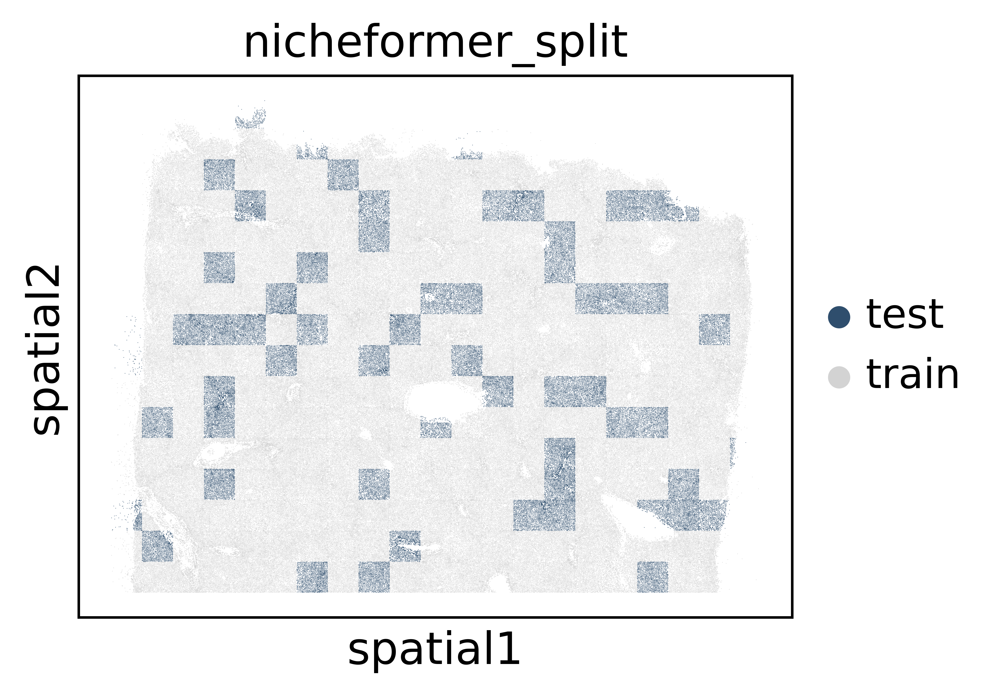

In [10]:
adata.uns['nicheformer_split_colors'] = ['#2F4E6D', 'lightgrey']
sc.settings.set_figure_params(dpi=500, facecolor='white')
sc.pl.spatial(adata, spot_size=0.01, color='nicheformer_split')

## 1. Spatial Overview — Cell Types & Niches

In [25]:
# Get spatial coordinates
spatial = adata.obsm['spatial']
x, y = spatial[:, 0], spatial[:, 1]

# Cell types and niches
cell_types = adata.obs['author_cell_type'].values
niches = adata.obs['niche'].values

print(f"Unique cell types ({len(np.unique(cell_types))}): {np.unique(cell_types)}")
print(f"Unique niches ({len(np.unique(niches))}): {np.unique(niches)}")

Unique cell types (19): ['Antibody.secreting.B.cells' 'CD3+.alpha.beta.T.cells'
 'Central.venous.LSECs' 'Cholangiocytes' 'Erthyroid.cells' 'Hep.1' 'Hep.3'
 'Hep.4' 'Hep.5' 'Hep.6' 'Inflammatory.macrophages' 'Mature.B.cells'
 'NK.like.cells' 'Non.inflammatory.macrophages' 'NotDet'
 'Periportal.LSECs' 'Portal.endothelial.cells' 'Stellate.cells'
 'gamma.delta.T.cells.1']
Unique niches (6): ['Zone_1a/PV' 'Zone_1b' 'Zone_2a' 'Zone_2b' 'Zone_3a' 'Zone_3b/CV']


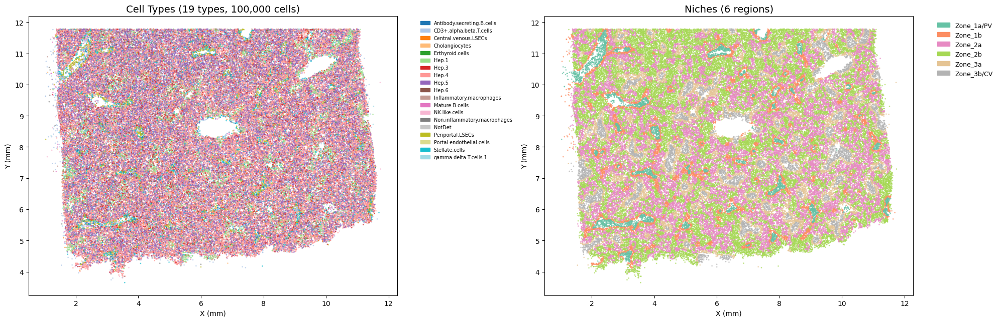

In [26]:
# Subsample for faster plotting (100k cells max)
max_cells = 100000
if adata.n_obs > max_cells:
    rng = np.random.default_rng(42)
    idx = rng.choice(adata.n_obs, size=max_cells, replace=False)
    x_s = x[idx]
    y_s = y[idx]
    ct_s = cell_types[idx]
    n_s = niches[idx]
else:
    x_s, y_s = x, y
    ct_s, n_s = cell_types, niches

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 9))

# --- Panel 1: Cell types ---
unique_ct = np.unique(ct_s)
ct_cmap = plt.cm.tab20(np.linspace(0, 1, len(unique_ct)))
ct_color_map = {ct: ct_cmap[i] for i, ct in enumerate(unique_ct)}
ct_colors = np.array([ct_color_map[ct] for ct in ct_s])

ax1.scatter(x_s, y_s, c=ct_colors, s=1, alpha=0.6, rasterized=True)
ax1.set_title(f"Cell Types ({len(unique_ct)} types, {len(x_s):,} cells)", fontsize=14)
ax1.set_xlabel("X (mm)")
ax1.set_ylabel("Y (mm)")
ax1.set_aspect('equal')

# Legend
patches = [mpatches.Patch(color=ct_cmap[i], label=ct) for i, ct in enumerate(unique_ct)]
ax1.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=7, frameon=False)

# --- Panel 2: Niches ---
unique_n = np.unique(n_s)
n_cmap = plt.cm.Set2(np.linspace(0, 1, len(unique_n)))
n_color_map = {n: n_cmap[i] for i, n in enumerate(unique_n)}
n_colors = np.array([n_color_map[n] for n in n_s])

ax2.scatter(x_s, y_s, c=n_colors, s=1, alpha=0.6, rasterized=True)
ax2.set_title(f"Niches ({len(unique_n)} regions)", fontsize=14)
ax2.set_xlabel("X (mm)")
ax2.set_ylabel("Y (mm)")
ax2.set_aspect('equal')

patches_n = [mpatches.Patch(color=n_cmap[i], label=n) for i, n in enumerate(unique_n)]
ax2.legend(handles=patches_n, bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=9, frameon=False)

plt.tight_layout()
plt.show()

## 2. Niche Composition Matrices Overview

Each `X_niche_{i}` is a `n_cells × n_cell_types` matrix where each row
contains the count of neighboring cells of each type within that radius.

In [27]:
radii = [0.027, 0.054, 0.081, 0.108, 0.135]
niche_keys = [f'X_niche_{i}' for i in range(len(radii))]

# Get cell type names from the niche composition columns
ct_names = list(adata.uns.get('niche', {}).get('columns', 
    adata.obs['author_cell_type'].cat.categories))
print(f"Cell types in niche matrices ({len(ct_names)}): {ct_names}")

# Summary statistics for each radius
stats = []
for i, key in enumerate(niche_keys):
    mat = adata.obsm[key]
    if hasattr(mat, 'toarray'):
        mat = mat.toarray()
    stats.append({
        'radius (mm)': radii[i],
        'mean neighbors': mat.sum(axis=1).mean(),
        'median neighbors': np.median(mat.sum(axis=1)),
        'max neighbors': mat.sum(axis=1).max(),
        'sparsity': (mat == 0).sum() / mat.size
    })

stats_df = pd.DataFrame(stats).set_index('radius (mm)')
stats_df

Cell types in niche matrices (19): ['Antibody.secreting.B.cells', 'CD3+.alpha.beta.T.cells', 'Central.venous.LSECs', 'Cholangiocytes', 'Erthyroid.cells', 'Hep.1', 'Hep.3', 'Hep.4', 'Hep.5', 'Hep.6', 'Inflammatory.macrophages', 'Mature.B.cells', 'NK.like.cells', 'Non.inflammatory.macrophages', 'NotDet', 'Periportal.LSECs', 'Portal.endothelial.cells', 'Stellate.cells', 'gamma.delta.T.cells.1']


,mean neighbors,median neighbors,max neighbors,sparsity
radius (mm),,,,
0.027,10.076274,10.0,34.0,0.776290
0.054,39.746038,41.0,103.0,0.579926
0.081,85.437258,89.0,202.0,0.444052
0.108,144.290197,150.0,312.0,0.355209
0.135,213.673086,218.0,445.0,0.294062


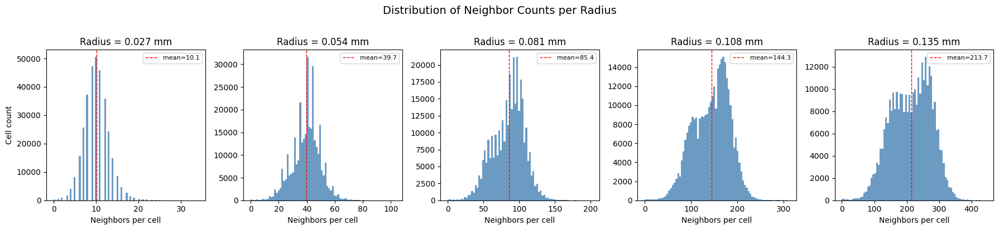

In [28]:
# Distribution of total neighbors per cell at each radius
fig, axes = plt.subplots(1, len(radii), figsize=(18, 4))

for i, (key, r) in enumerate(zip(niche_keys, radii)):
    mat = adata.obsm[key]
    if hasattr(mat, 'toarray'):
        mat = mat.toarray()
    n_neighbors = mat.sum(axis=1)
    
    ax = axes[i]
    ax.hist(n_neighbors, bins=80, color='steelblue', edgecolor='none', alpha=0.8)
    ax.set_title(f"Radius = {r} mm", fontsize=12)
    ax.set_xlabel("Neighbors per cell")
    if i == 0:
        ax.set_ylabel("Cell count")
    ax.axvline(n_neighbors.mean(), color='red', linestyle='--', lw=1, label=f"mean={n_neighbors.mean():.1f}")
    ax.legend(fontsize=8)

plt.suptitle("Distribution of Neighbor Counts per Radius", fontsize=14, y=1.02)
plt.tight_layout()
plt.show()

## 3. Niche Composition Heatmap (Mean Composition per Cell Type)

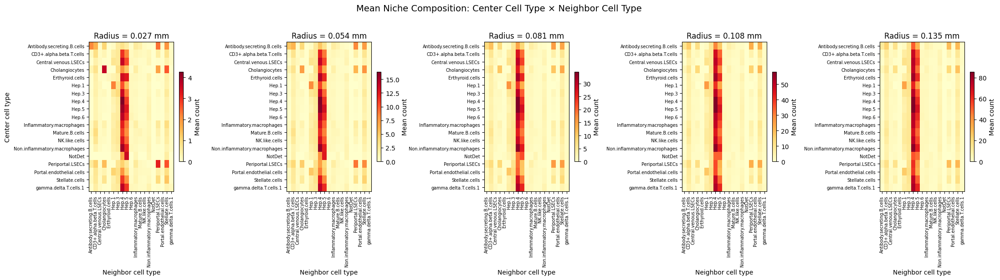

In [29]:
# For each radius, compute mean niche composition per cell type
fig, axes = plt.subplots(1, len(radii), figsize=(22, 6))

for i, (key, r) in enumerate(zip(niche_keys, radii)):
    mat = adata.obsm[key]
    if hasattr(mat, 'toarray'):
        mat = mat.toarray()
    
    # Mean composition per cell type
    ct_labels = adata.obs['author_cell_type'].values
    df = pd.DataFrame(mat, columns=ct_names)
    df['cell_type'] = ct_labels
    mean_comp = df.groupby('cell_type').mean()
    
    ax = axes[i]
    im = ax.imshow(mean_comp.values, aspect='auto', cmap='YlOrRd', 
                   norm=Normalize(vmin=0, vmax=mean_comp.values.max()))
    ax.set_xticks(range(len(ct_names)))
    ax.set_xticklabels(ct_names, rotation=90, fontsize=7)
    ax.set_yticks(range(len(mean_comp.index)))
    ax.set_yticklabels(mean_comp.index, fontsize=7)
    ax.set_title(f"Radius = {r} mm", fontsize=12)
    ax.set_xlabel("Neighbor cell type")
    if i == 0:
        ax.set_ylabel("Center cell type")
    plt.colorbar(im, ax=ax, shrink=0.6, label="Mean count")

plt.suptitle("Mean Niche Composition: Center Cell Type × Neighbor Cell Type", fontsize=14, y=1.02)
plt.tight_layout()
plt.show()

## 4. Spatial Visualization of Niche Composition

For a selected cell type, visualize its spatial distribution and the
abundance of that cell type in the niche of every other cell.

In [30]:
# Pick a cell type to visualize niche enrichment spatially
# Choose one with interesting spatial patterns
ct_counts = adata.obs['author_cell_type'].value_counts()
print("Cell type abundances (top 15):")
print(ct_counts.head(15))

# Let user pick or default to the most abundant non-hepatocyte type
target_ct = "Kupffer cell" if "Kupffer cell" in ct_counts.index else ct_counts.index[1]
target_idx = ct_names.index(target_ct) if target_ct in ct_names else 0
print(f"\nVisualizing niche enrichment for: '{target_ct}' (column {target_idx})")

Cell type abundances (top 15):
Hep.4                           125997
Hep.5                            89334
Hep.3                            21274
Hep.1                            17364
Stellate.cells                   16482
CD3+.alpha.beta.T.cells          13664
Non.inflammatory.macrophages      9556
Hep.6                             6183
Periportal.LSECs                  6083
Inflammatory.macrophages          5882
Cholangiocytes                    4783
Central.venous.LSECs              4416
gamma.delta.T.cells.1             3181
Mature.B.cells                    2928
NK.like.cells                     2752
Name: author_cell_type, dtype: int64

Visualizing niche enrichment for: 'Hep.5' (column 8)


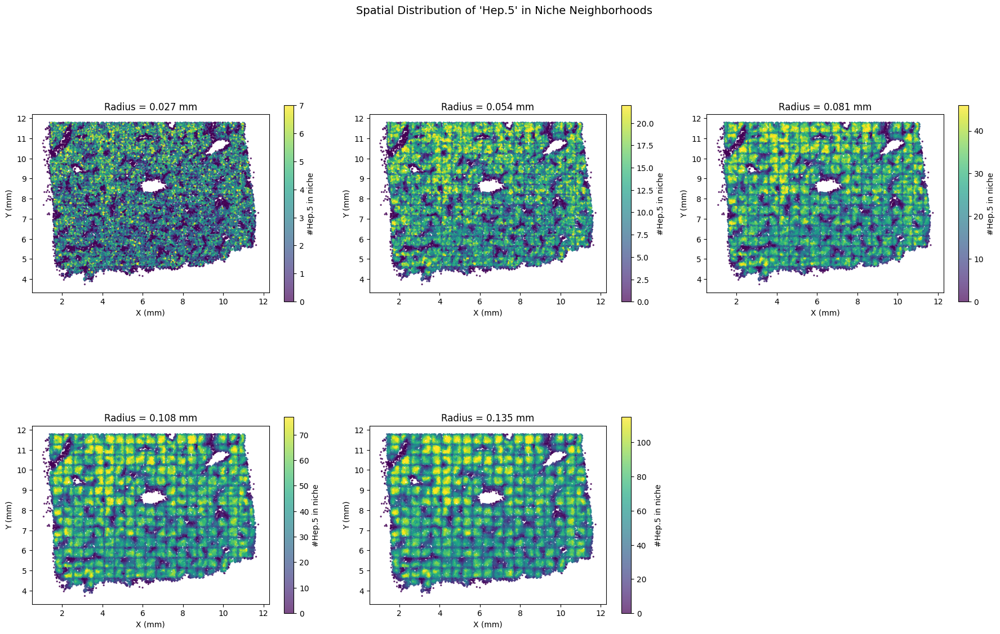

In [32]:
# Subsample for spatial plots
max_plot = 50000
if adata.n_obs > max_plot:
    rng = np.random.default_rng(42)
    idx = rng.choice(adata.n_obs, size=max_plot, replace=False)
else:
    idx = slice(None)

x_plot = spatial[idx, 0]
y_plot = spatial[idx, 1]

fig, axes = plt.subplots(2, 3, figsize=(18, 12))

for i, (key, r) in enumerate(zip(niche_keys, radii)):
    mat = adata.obsm[key]
    if hasattr(mat, 'toarray'):
        mat = mat.toarray()
    
    ax = axes[i // 3][i % 3]
    niche_vals = mat[idx, target_idx]
    
    sc = ax.scatter(x_plot, y_plot, c=niche_vals, s=2, 
                    cmap='viridis', alpha=0.7, rasterized=True,
                    norm=Normalize(vmin=0, vmax=np.percentile(niche_vals, 98)))
    ax.set_title(f"Radius = {r} mm", fontsize=12)
    ax.set_xlabel("X (mm)")
    ax.set_ylabel("Y (mm)")
    ax.set_aspect('equal')
    plt.colorbar(sc, ax=ax, shrink=0.6, label=f"#{target_ct} in niche")

# Hide the last unused subplot
axes[1][2].set_visible(False)

plt.suptitle(f"Spatial Distribution of '{target_ct}' in Niche Neighborhoods", 
             fontsize=14, y=1.01)
plt.tight_layout()
plt.show()

## 5. Niche Composition Similarity (t-SNE / UMAP on Niche Profiles)

Embed cells by their niche composition profile to see if cells with
similar spatial microenvironments cluster together.

In [ ]:
# Concatenate all niche matrices and run UMAP on niche profiles
# Use the largest radius for the most comprehensive niche view
niche_mat = adata.obsm['X_niche_4']
if hasattr(niche_mat, 'toarray'):
    niche_mat = niche_mat.toarray()

print(f"Niche profile matrix shape: {niche_mat.shape}")

# Subsample for UMAP (50k max)
n_umap = min(50000, adata.n_obs)
rng = np.random.default_rng(42)
umap_idx = rng.choice(adata.n_obs, size=n_umap, replace=False)

niche_subset = niche_mat[umap_idx]
ct_subset = adata.obs['author_cell_type'].values[umap_idx]
n_subset = adata.obs['niche'].values[umap_idx]

from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler

# Standardize and run t-SNE
scaler = StandardScaler()
niche_scaled = scaler.fit_transform(niche_subset)

tsne = TSNE(n_components=2, random_state=42, perplexity=30)
niche_tsne = tsne.fit_transform(niche_scaled)

print(f"t-SNE embedding shape: {niche_tsne.shape}")

Niche profile matrix shape: (332877, 19)
t-SNE embedding shape: (50000, 2)


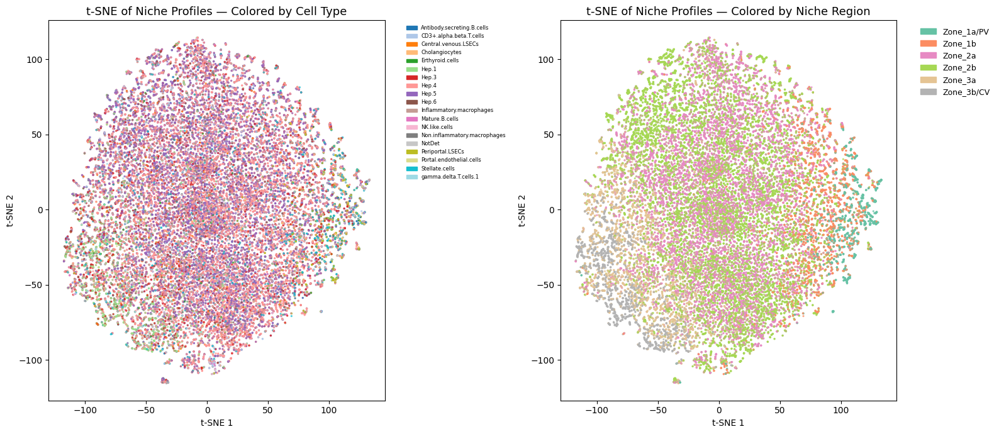

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 7))

# Color by cell type
unique_ct = np.unique(ct_subset)
ct_cmap = plt.cm.tab20(np.linspace(0, 1, len(unique_ct)))
ct_color_map = {ct: ct_cmap[i] for i, ct in enumerate(unique_ct)}
ct_colors = np.array([ct_color_map[ct] for ct in ct_subset])

ax1.scatter(niche_tsne[:, 0], niche_tsne[:, 1], c=ct_colors, s=2, alpha=0.6, rasterized=True)
ax1.set_title("t-SNE of Niche Profiles — Colored by Cell Type", fontsize=13)
ax1.set_xlabel("t-SNE 1")
ax1.set_ylabel("t-SNE 2")
patches = [mpatches.Patch(color=ct_cmap[i], label=ct) for i, ct in enumerate(unique_ct)]
ax1.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=6, frameon=False)

# Color by niche region
unique_n = np.unique(n_subset)
n_cmap = plt.cm.Set2(np.linspace(0, 1, len(unique_n)))
n_color_map = {n: n_cmap[i] for i, n in enumerate(unique_n)}
n_colors = np.array([n_color_map[n] for n in n_subset])

ax2.scatter(niche_tsne[:, 0], niche_tsne[:, 1], c=n_colors, s=2, alpha=0.6, rasterized=True)
ax2.set_title("t-SNE of Niche Profiles — Colored by Niche Region", fontsize=13)
ax2.set_xlabel("t-SNE 1")
ax2.set_ylabel("t-SNE 2")
patches_n = [mpatches.Patch(color=n_cmap[i], label=n) for i, n in enumerate(unique_n)]
ax2.legend(handles=patches_n, bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=9, frameon=False)

plt.tight_layout()
plt.show()

## 6. Niche Composition by Niche Region (Boxplot)

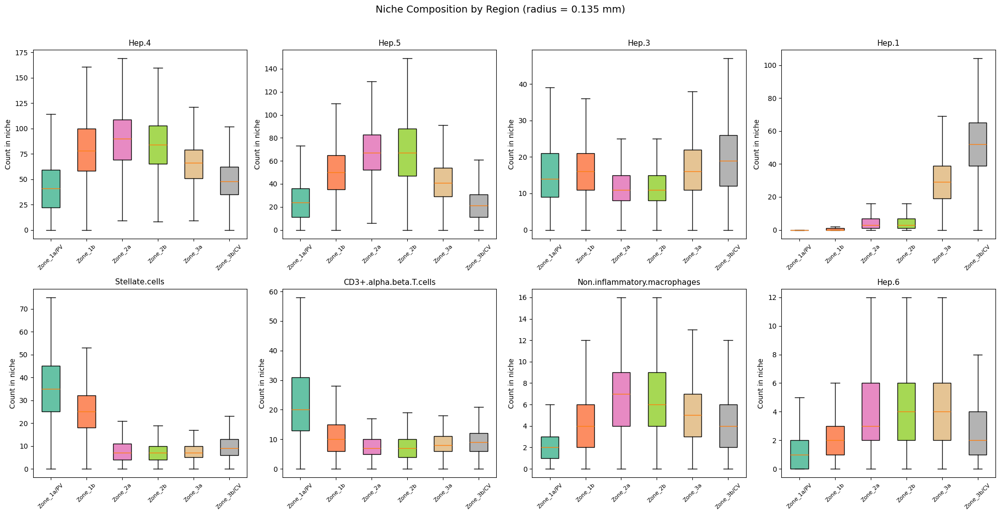

In [ ]:
# For the largest radius, show how niche composition varies by region
niche_mat = adata.obsm['X_niche_4']
if hasattr(niche_mat, 'toarray'):
    niche_mat = niche_mat.toarray()

# Pick top cell types by abundance
top_n = min(8, len(ct_names))
top_ct = ct_counts.head(top_n).index.tolist()
top_indices = [ct_names.index(ct) for ct in top_ct if ct in ct_names]

niche_labels = adata.obs['niche'].values
unique_niche_labels = np.unique(niche_labels)

fig, axes = plt.subplots(2, 4, figsize=(20, 10))
axes = axes.flatten()

for idx, (ct_name, col_idx) in enumerate(zip(top_ct, top_indices)):
    ax = axes[idx]
    data = []
    labels = []
    for n_label in unique_niche_labels:
        mask = niche_labels == n_label
        vals = niche_mat[mask, col_idx]
        data.append(vals)
        labels.append(str(n_label))
    
    bp = ax.boxplot(data, labels=labels, patch_artist=True, showfliers=False)
    for patch, color in zip(bp['boxes'], plt.cm.Set2(np.linspace(0, 1, len(labels)))):
        patch.set_facecolor(color)
    ax.set_title(f"{ct_name}", fontsize=11)
    ax.set_ylabel("Count in niche")
    ax.tick_params(axis='x', rotation=45, labelsize=8)

# Hide unused subplots
for j in range(len(top_ct), len(axes)):
    axes[j].set_visible(False)

plt.suptitle("Niche Composition by Region (radius = 0.135 mm)", fontsize=14, y=1.02)
plt.tight_layout()
plt.show()

## 7. Radius Comparison — How Niche Composition Changes with Scale

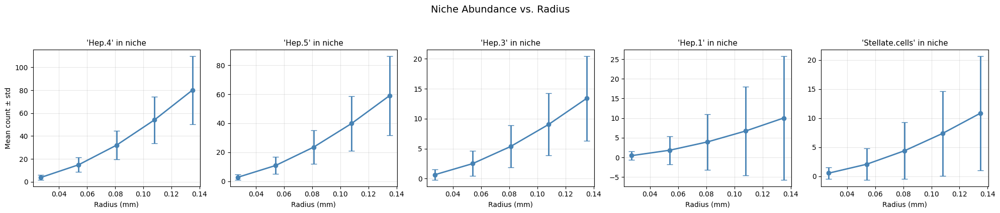

In [ ]:
# For a few selected cell types, show how their niche abundance changes with radius
selected_ct = top_ct[:5]  # first 5 abundant types
selected_indices = [ct_names.index(ct) for ct in selected_ct if ct in ct_names]

fig, axes = plt.subplots(1, len(selected_ct), figsize=(20, 4))

for idx, (ct_name, col_idx) in enumerate(zip(selected_ct, selected_indices)):
    ax = axes[idx]
    
    means = []
    stds = []
    for key in niche_keys:
        mat = adata.obsm[key]
        if hasattr(mat, 'toarray'):
            mat = mat.toarray()
        means.append(mat[:, col_idx].mean())
        stds.append(mat[:, col_idx].std())
    
    ax.errorbar(radii, means, yerr=stds, marker='o', capsize=4, color='steelblue', linewidth=2)
    ax.set_title(f"'{ct_name}' in niche", fontsize=11)
    ax.set_xlabel("Radius (mm)")
    if idx == 0:
        ax.set_ylabel("Mean count ± std")
    ax.grid(True, alpha=0.3)

plt.suptitle("Niche Abundance vs. Radius", fontsize=14, y=1.05)
plt.tight_layout()
plt.show()

## Summary

| Radius (mm) | Key | Mean Neighbors | Description |
|---|---|---|---|
| 0.027 | `X_niche_0` | — | Very local (single-cell scale) |
| 0.054 | `X_niche_1` | — | Local microenvironment |
| 0.081 | `X_niche_2` | — | Intermediate |
| 0.108 | `X_niche_3` | — | Extended neighborhood |
| 0.135 | `X_niche_4` | — | Broad tissue context |